In [ ]:
import os
import uuid
import json
from pathlib import Path
from ultralytics import YOLO
import cv2

# CONFIG
MODEL_PATH = "runs/detect/best_scarecrow/weights/best.pt" 
TEST_IMAGES_DIR = "datasets/scarecrow_dataset/test/images/"  
OUTPUT_JSON = "predictions.json"
CONFIDENCE_THRESHOLD = 0.25

# Load model
model = YOLO(MODEL_PATH)

# Prepare output list
results_json = []

# Iterate through test images
for image_file in Path(TEST_IMAGES_DIR).glob("*.*"):
    img = cv2.imread(str(image_file))
    height, width = img.shape[:2]

    results = model.predict(source=str(image_file), conf=CONFIDENCE_THRESHOLD, verbose=False)

    prediction = results[0]
    annotations = []
    for box in prediction.boxes:
        x1, y1, x2, y2 = box.xyxy[0].tolist()
        conf = float(box.conf[0])
        label_idx = int(box.cls[0])
        label = model.names[label_idx]

        coordinates = [
            {"X": x1, "Y": y1},
            {"X": x2, "Y": y1},
            {"X": x2, "Y": y2},
            {"X": x1, "Y": y2}
        ]

        annotations.append({
            "Label": label,
            "Confidence": conf,
            "Coordinates": coordinates
        })

    results_json.append({
        "NormalizedName": str(uuid.uuid4()),
        "OriginalFileName": image_file.name,
        "AnnotationData": annotations
    })
    
# Save to JSON
with open(OUTPUT_JSON, "w") as f:
    json.dump(results_json, f, indent=4)


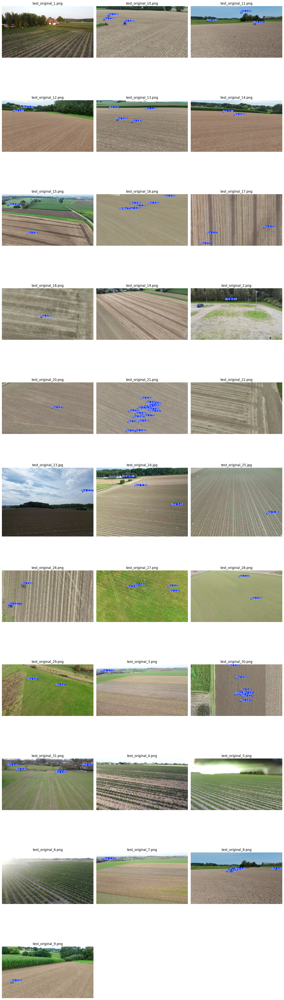

In [ ]:
import os
import uuid
import json
from pathlib import Path
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

# CONFIG
MODEL_PATH = "runs/detect/best_scarecrow/weights/best.pt"
TEST_IMAGES_DIR = "datasets/scarecrow_dataset/test/images/"
OUTPUT_JSON = "predictions.json"
OUTPUT_IMAGE_DIR = "annotated_images/"
CONFIDENCE_THRESHOLD = 0.25

# Create output folder if it doesn't exist
os.makedirs(OUTPUT_IMAGE_DIR, exist_ok=True)

# Load model
model = YOLO(MODEL_PATH)

# Prepare output list
results_json = []
annotated_images = []  
titles = []            

# Iterate through test images
for image_file in Path(TEST_IMAGES_DIR).glob("*.*"):
    img = cv2.imread(str(image_file))
    height, width = img.shape[:2]

    results = model.predict(source=str(image_file), conf=CONFIDENCE_THRESHOLD, verbose=False)

    prediction = results[0]
    annotations = []
    for box in prediction.boxes:
        x1, y1, x2, y2 = box.xyxy[0].tolist()
        conf = float(box.conf[0])
        label_idx = int(box.cls[0])
        label = model.names[label_idx]

        coordinates = [
            {"X": x1, "Y": y1},
            {"X": x2, "Y": y1},
            {"X": x2, "Y": y2},
            {"X": x1, "Y": y2}
        ]

        annotations.append({
            "Label": label,
            "Confidence": conf,
            "Coordinates": coordinates
        })

    results_json.append({
        "NormalizedName": str(uuid.uuid4()),
        "OriginalFileName": image_file.name,
        "AnnotationData": annotations
    })

    for r in results:
        annotated_frame = r.plot()
        annotated_images.append(annotated_frame[..., ::-1])  # Convert to RGB
        titles.append(image_file.name)

        # Save image
        save_path = Path(OUTPUT_IMAGE_DIR) / f"annotated_{image_file.name}"
        cv2.imwrite(str(save_path), annotated_frame)

# Display all annotated images in a grid
cols = 3
rows = (len(annotated_images) + cols - 1) // cols
plt.figure(figsize=(15, 5 * rows))
for i, img in enumerate(annotated_images):
    plt.subplot(rows, cols, i + 1)
    plt.imshow(img)
    plt.title(titles[i])
    plt.axis('off')
plt.tight_layout()
plt.show()

# Save JSON output
with open(OUTPUT_JSON, "w") as f:
    json.dump(results_json, f, indent=4)
